In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
%matplotlib inline

In [2]:
mnist_data = pd.read_csv("C:/Users/shadm/Desktop/MNIST/mnist_train.csv")
mnist_data.head()


,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
new_column_name = ['label']
for num in range(mnist_data.shape[1]-1):
    tem = 'pixel' + str(num)
    new_column_name.append(tem)
    
mnist_data.columns = new_column_name
mnist_data.head()


,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


(60000, 785)


(60000, 785)

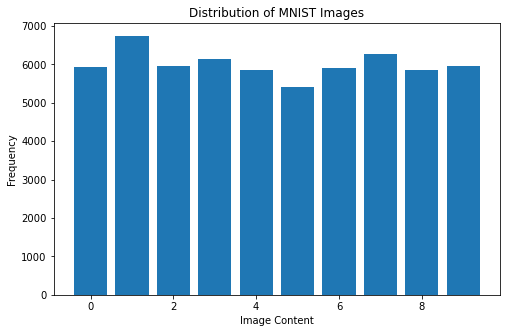

In [4]:
num_states = defaultdict(int)

for num in mnist_data['label']:
    num_states[num] += 1
    
x = sorted(num_states)
y = [num_states[num] for num in x]

plt.figure(figsize=(8, 5))
plt.bar(x, height=y)
plt.xlabel("Image Content")
plt.ylabel("Frequency")
plt.title("Distribution of MNIST Images")
print(mnist_data.shape)
mnist_data.dropna().shape

In [5]:
result = mnist_data['label'] 
predictors = mnist_data.drop(['label'], axis = 1)

In [6]:
X = predictors.values

In [7]:
X_std = StandardScaler().fit_transform(X)

In [8]:
data_sample = mnist_data.sample(60000)

data_y = data_sample["label"]
data_x = data_sample.drop(["label"], axis = 1)

In [10]:
pca_std = StandardScaler().fit_transform(data_x.values)

pca = PCA(n_components=2)
x_2 = pca.fit(pca_std).transform(pca_std)

# KMeans

In [11]:
kmeans = KMeans(n_clusters=10, n_jobs=-1)
kmeans_9 = kmeans.fit_predict(x_2)

data = [
    go.Scatter(
    x = x_2[:, 0],
    y = x_2[:, 1],
    mode = "markers",
    showlegend = False,
    marker = dict(
    size=8,
    color=kmeans_9,
    colorscale='Rainbow',
    showscale=False,
    line = dict(
    width = 2,
    color = 'rgb(255, 255, 255)'
    )))]
layout = go.Layout(
    title = 'KMeans Clustering',
    hovermode= 'closest',
    xaxis = dict(
        title = 'First Principal Component',
        ticklen = 8,
        zeroline = False,
        gridwidth = 2,
    ),
    showlegend= True
)
fig = dict(data = data, layout = layout)
py.iplot(fig, filename = "kmeans_plot")

C:\Users\shadm\AppData\Roaming\Python\Python37\site-packages\sklearn\cluster\_kmeans.py:974: FutureWarning:

'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.



# DBScan

In [14]:
DB = DBSCAN(eps=1, min_samples=19, n_jobs=-1)
DB_1 = DB.fit_predict(x_2)
n_noise_ = list(DB_1).count(-1)
#print("number of cluster= ", y.max())
print("number of noise= ", n_noise_)
data = [
    go.Scatter(
    x = x_2[:, 0],
    y = x_2[:, 1],
    mode = "markers",
    showlegend = False,
    marker = dict(
    size=8,
    color=DB_1,
    colorscale='Rainbow',
    showscale=False,
    line = dict(
    width = 2,
    color = 'rgb(255, 255, 255)'
    )))]
layout = go.Layout(
    title = 'DBScan Clustering',
    hovermode= 'closest',
    xaxis = dict(
        title = 'First Principal Component',
        ticklen = 8,
        zeroline = False,
        gridwidth = 2,
    ),
    showlegend= True
)
fig = dict(data = data, layout = layout)
py.iplot(fig, filename = "DB_plot")

number of noise=  541


Text(0, 0.5, 'inertia')

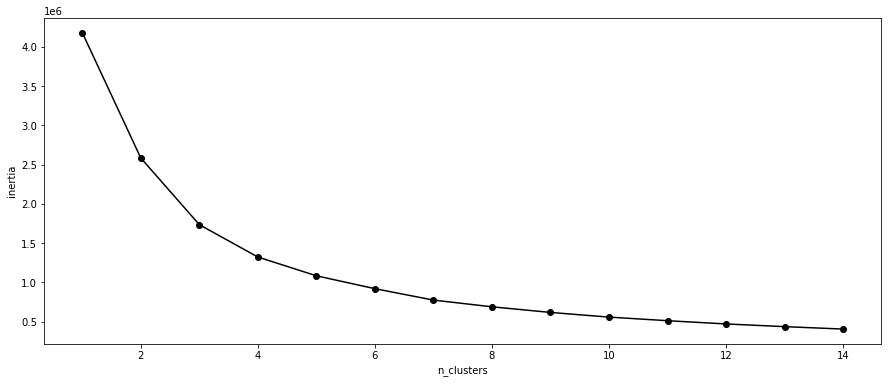

In [15]:
inertias = []

for k in range(1,15):
    clu = KMeans(n_clusters=k)
    clu.fit_predict(x_2)
    inertias.append(clu.inertia_)

plt.figure(figsize=(15, 6)) 
plt.plot(range(1,15), inertias, 'ko-')
plt.xlabel('n_clusters')
plt.ylabel('inertia')

In [16]:
def dumResults():
    clusterData = []
    for i in range(10):
        clusterData.append([])
    for i in range(len(labels)):
        clusterData[labels[i]].append([characterDataList[i], labelList[i]])
    
    for l in range(10):
        print("Plotting for label %d" % (l))
        fig, axes = plt.subplot(nrows=10, ncols=10, sharex=True)
        fig.set_figheight(15)
        fig.set_figwidth(15)
        count = 0
        randomNoList = random.sample(range(0 , len(clusterData[1])), 100)
        for i in range(10):
            for j in range(10):
                axes[i][j].imshow(clusterData[l][randomNoList[count]][0])
                count += 1
        fig.savefig(kMeansOPDir + 'kmeans_cluster' + str(l) + 'png')
    return clusterData

In [17]:
def evaluateKMeans(clusterData):
    print('')
    totalAccuracy = 0
    for j in range(10):
        labelsClusteredList = []
        for i in range(10):
            labelsClusteredList.append(0)
        for i in range(len(clusterData[j])):
            labelsClusteredList[clusterData[j][i][1].index(1.0)] += 1
        clusterAccuracy = max(labelsClusteredList) / sum(labelsClusteredList) * 100.0
        totalAccuracy += clusterAccuracy
    print("KMeans clustering Accuracy " + str(totalAccuracy / 10))